# Setting Up YOLO

In [15]:
!pip install ultralytics opencv-python --quiet


In [16]:
from ultralytics import YOLO

# Load pretrained YOLOv8n model (n = nano, good for faster inference)
model = YOLO('yolov8n.pt')  # or 'yolov8s.pt' for small, 'yolov8m.pt' for medium


# Implementing Object Detection


Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /kaggle/working/bus.jpg: 640x480 4 persons, 1 bus, 1 stop sign, 42.0ms
Speed: 2.7ms preprocess, 42.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


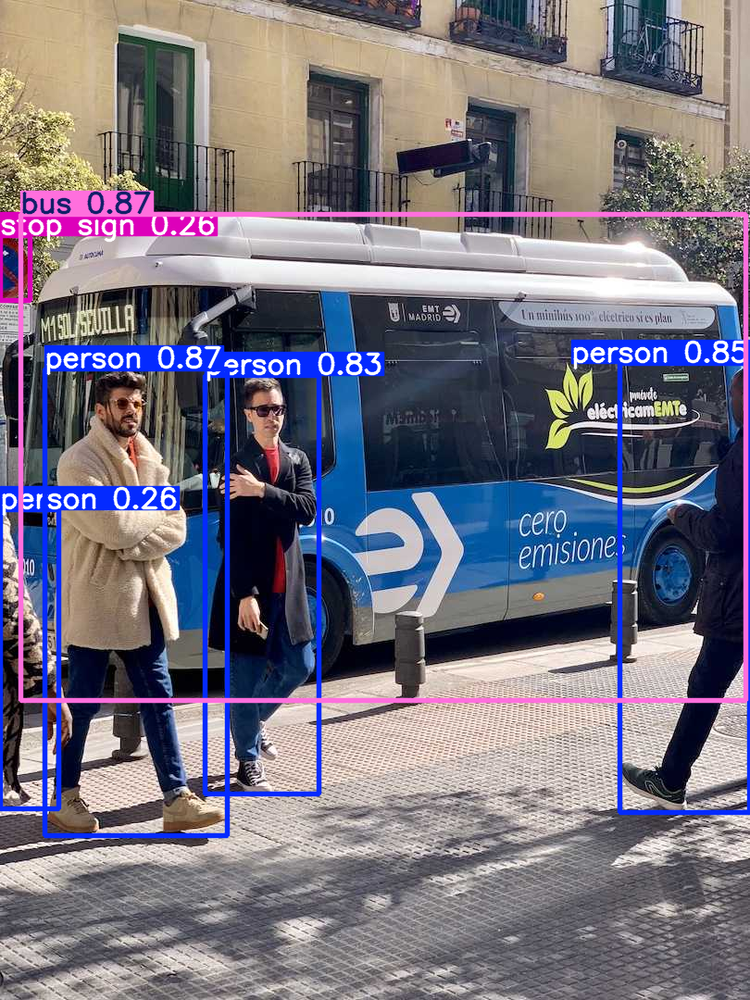

In [17]:
# Perform inference
results = model('https://ultralytics.com/images/bus.jpg')

# Visualize
results[0].show()  # Opens image with bounding boxes

In [18]:
results[0].save(filename='output.jpg')


'output.jpg'

In [19]:
import yaml

# Path to your yolov8.yaml file
yaml_file_path = '/kaggle/input/tt100k/mydata/YOLOv8_TT100K.yaml'

with open(yaml_file_path, 'r', encoding='utf-8') as file:
    config = yaml.safe_load(file)

# View the content
config


{'train': '/kaggle/working/ultralytics/mydata/images/train',
 'val': '/kaggle/working/ultralytics/mydata/images/val',
 'test': None,
 'nc': 50,
 'names': ['pl80',
  'p6',
  'ph',
  'w',
  'pa',
  'p27',
  'i5',
  'p1',
  'il70',
  'p5',
  'pm',
  'p19',
  'ip',
  'p11',
  'p13',
  'p26',
  'i2',
  'pn',
  'p10',
  'p23',
  'pbp',
  'p3',
  'p12',
  'pne',
  'i4',
  'pb',
  'pg',
  'pr',
  'pl5',
  'pl10',
  'pl15',
  'pl20',
  'pl25',
  'pl30',
  'pl35',
  'pl40',
  'pl50',
  'pl60',
  'pl65',
  'pl70',
  'pl90',
  'pl100',
  'pl110',
  'pl120',
  'il50',
  'il60',
  'il80',
  'il90',
  'il100',
  'il110']}

In [20]:
import yaml

# Path to your yolov8.yaml file
yaml_file_path = '/kaggle/input/tt100k/mydata/YOLOv8_TT100K.yaml'

# Load and update the YAML config
with open(yaml_file_path, 'r', encoding='utf-8') as file:
    config = yaml.safe_load(file)

# Update the paths to the correct location in the input directory
config['train'] = '/kaggle/input/tt100k/mydata/images/train'
config['val'] = '/kaggle/input/tt100k/mydata/images/val'


# Check the updated config
config


{'train': '/kaggle/input/tt100k/mydata/images/train',
 'val': '/kaggle/input/tt100k/mydata/images/val',
 'test': None,
 'nc': 50,
 'names': ['pl80',
  'p6',
  'ph',
  'w',
  'pa',
  'p27',
  'i5',
  'p1',
  'il70',
  'p5',
  'pm',
  'p19',
  'ip',
  'p11',
  'p13',
  'p26',
  'i2',
  'pn',
  'p10',
  'p23',
  'pbp',
  'p3',
  'p12',
  'pne',
  'i4',
  'pb',
  'pg',
  'pr',
  'pl5',
  'pl10',
  'pl15',
  'pl20',
  'pl25',
  'pl30',
  'pl35',
  'pl40',
  'pl50',
  'pl60',
  'pl65',
  'pl70',
  'pl90',
  'pl100',
  'pl110',
  'pl120',
  'il50',
  'il60',
  'il80',
  'il90',
  'il100',
  'il110']}

In [21]:
# Save the updated YAML config back
updated_yaml_path = '/kaggle/working/yolov8_updated.yaml'

with open(updated_yaml_path, 'w') as file:
    yaml.dump(config, file)


In [ ]:
from ultralytics import YOLO

# Load the pretrained YOLOv8 model
model = YOLO('yolov8n.pt')  # Use yolov8s, yolov8m, or yolov8l if needed

# Start training with the updated YAML config
model.train(data=updated_yaml_path, epochs=20, imgsz=640, batch=16, lr0=0.001)


Ultralytics 8.3.102 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/yolov8_updated.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sho

In [10]:
# Evaluate the trained model on the validation set
metrics = model.val()

# Print evaluation metrics like precision, recall, and mAP
metrics


Ultralytics 8.3.102 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 3,015,398 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/input/tt100k/mydata/labels/val... 3627 images, 29 backgrounds, 0 corrupt: 100%|██████████| 3627/3627 [00:05<00:00, 638.41it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/tt100k/mydata/labels is not writeable, cache not saved.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 227/227 [00:46<00:00,  4.86it/s]


                   all       3627      10823      0.617      0.503      0.566      0.469
                  pl80        235        264      0.419      0.221      0.334      0.286
                    p6        108        161      0.646      0.472      0.517      0.467
                    ph        158        185       0.75      0.541      0.628      0.496
                     w        402        495      0.871      0.706      0.789      0.513
                    pa         38         91      0.442      0.705      0.716      0.659
                   p27        116        169      0.821      0.517      0.616      0.534
                    i5        474        498      0.876      0.793      0.875      0.622
                    p1         89        142       0.69      0.486      0.573      0.511
                  il70        110        132      0.702       0.47      0.635      0.574
                    p5        131        136      0.696      0.454       0.53      0.436
                    p

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.3ms preprocess, 2.2ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78e87dafe1a0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.

# **Fine Tuning**

In [22]:
model = YOLO('yolov8s.pt')  # Small model, more accurate than yolov8n

In [ ]:
model.train(
    data=updated_yaml_path,
    epochs=30,
    imgsz=640,
    batch=16,
    lr0=0.001,         # initial LR
    cos_lr=True,       # cosine learning rate scheduler
    patience=15        # early stopping (optional)
)


Ultralytics 8.3.103 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/working/yolov8_updated.yaml, epochs=30, time=None, patience=15, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_c

100%|██████████| 755k/755k [00:00<00:00, 24.0MB/s]


Overriding model.yaml nc=80 with nc=50

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 87.3MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/tt100k/mydata/labels/train... 20594 images, 140 backgrounds, 0 corrupt: 100%|██████████| 20594/20594 [02:56<00:00, 116.75it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/tt100k/mydata/labels is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/input/tt100k/mydata/labels/val... 3627 images, 29 backgrounds, 0 corrupt: 100%|██████████| 3627/3627 [00:33<00:00, 108.88it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/tt100k/mydata/labels is not writeable, cache not saved.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000185, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      4.36G      1.063      4.301     0.8362         15        640: 100%|██████████| 1288/1288 [06:59<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:47<00:00,  2.42it/s]


                   all       3627      10823      0.333       0.36       0.29      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      4.38G     0.8577      1.563     0.8081          3        640: 100%|██████████| 1288/1288 [06:50<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:46<00:00,  2.45it/s]


                   all       3627      10823       0.49       0.46      0.467      0.372

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      4.38G     0.8091      1.246     0.8051         17        640: 100%|██████████| 1288/1288 [06:46<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:45<00:00,  2.51it/s]


                   all       3627      10823        0.6      0.478      0.541      0.432

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      4.38G     0.7745      1.074     0.8034          3        640: 100%|██████████| 1288/1288 [06:45<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:45<00:00,  2.48it/s]


                   all       3627      10823      0.693      0.498      0.596      0.481

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      4.38G     0.7535     0.9719     0.8004         13        640: 100%|██████████| 1288/1288 [06:45<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:46<00:00,  2.47it/s]


                   all       3627      10823      0.706      0.525      0.626      0.509

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      4.38G     0.7315     0.8957     0.7975          6        640: 100%|██████████| 1288/1288 [06:45<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:45<00:00,  2.49it/s]


                   all       3627      10823      0.734      0.552      0.659      0.539

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      4.38G     0.7275     0.8648     0.7963         10        640: 100%|██████████| 1288/1288 [06:44<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:45<00:00,  2.51it/s]


                   all       3627      10823      0.771      0.569      0.686      0.561

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      4.38G      0.706     0.8038     0.7959         10        640: 100%|██████████| 1288/1288 [06:44<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:45<00:00,  2.51it/s]


                   all       3627      10823      0.797      0.564        0.7      0.574

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      4.38G     0.6915     0.7687     0.7942         10        640: 100%|██████████| 1288/1288 [06:44<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:45<00:00,  2.49it/s]


                   all       3627      10823      0.782      0.594      0.713      0.584

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      4.38G     0.6777     0.7448     0.7935          6        640: 100%|██████████| 1288/1288 [06:44<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:45<00:00,  2.50it/s]


                   all       3627      10823      0.789      0.603      0.721      0.595

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      4.38G      0.672     0.7162     0.7932          8        640: 100%|██████████| 1288/1288 [06:44<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:45<00:00,  2.51it/s]


                   all       3627      10823      0.799      0.615      0.734      0.605

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      4.38G       0.66     0.6937      0.793         16        640: 100%|██████████| 1288/1288 [06:45<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:46<00:00,  2.47it/s]


                   all       3627      10823      0.796      0.628      0.743      0.614

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      4.38G     0.6506     0.6697     0.7905          1        640: 100%|██████████| 1288/1288 [06:45<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:46<00:00,  2.46it/s]


                   all       3627      10823      0.827       0.62      0.748      0.618

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      4.38G     0.6466     0.6524     0.7912          7        640: 100%|██████████| 1288/1288 [06:44<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:47<00:00,  2.40it/s]


                   all       3627      10823      0.846      0.614      0.754      0.623

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      4.38G     0.6369     0.6356     0.7887         65        640:  51%|█████     | 658/1288 [03:27<03:13,  3.25it/s]

In [24]:
model = YOLO('/kaggle/working/runs/detect/train/weights/last.pt')  
model.train(
    data=updated_yaml_path,
    epochs=30,       
    imgsz=640,
    batch=16,
    lr0=0.001,
    cos_lr=True,
    patience=15,
    resume=True
)


Ultralytics 8.3.103 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=/kaggle/working/runs/detect/train/weights/last.pt, data=/kaggle/working/yolov8_updated.yaml, epochs=30, time=None, patience=15, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=/kaggle/working/runs/detect/train/weights/last.pt, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frame

train: Scanning /kaggle/input/tt100k/mydata/labels/train... 20594 images, 140 backgrounds, 0 corrupt: 100%|██████████| 20594/20594 [00:33<00:00, 621.77it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/tt100k/mydata/labels is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/tt100k/mydata/labels/val... 3627 images, 29 backgrounds, 0 corrupt: 100%|██████████| 3627/3627 [00:05<00:00, 648.38it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/tt100k/mydata/labels is not writeable, cache not saved.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000185, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Resuming training /kaggle/working/runs/detect/train/weights/last.pt from epoch 19 to 30 total epochs
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      8.44G     0.6089     0.5867     0.7874         15        640: 100%|██████████| 1288/1288 [06:48<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:45<00:00,  2.48it/s]


                   all       3627      10823      0.836      0.656      0.777      0.645

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      8.45G     0.5995     0.5641     0.7868          3        640: 100%|██████████| 1288/1288 [06:48<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:45<00:00,  2.48it/s]


                   all       3627      10823      0.854      0.656      0.784      0.652
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      8.45G     0.5591     0.4925     0.7847          3        640: 100%|██████████| 1288/1288 [06:46<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:46<00:00,  2.47it/s]


                   all       3627      10823       0.84      0.661      0.782      0.649

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      8.45G     0.5479     0.4826     0.7833          9        640: 100%|██████████| 1288/1288 [06:46<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:48<00:00,  2.35it/s]


                   all       3627      10823       0.85      0.658      0.785      0.652

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      8.45G     0.5437     0.4682     0.7827          8        640: 100%|██████████| 1288/1288 [06:47<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:45<00:00,  2.48it/s]


                   all       3627      10823      0.859      0.656      0.787      0.655

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      8.45G     0.5378     0.4623     0.7843          7        640: 100%|██████████| 1288/1288 [06:45<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:47<00:00,  2.39it/s]


                   all       3627      10823      0.855      0.664      0.791      0.658

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      8.45G     0.5308     0.4511     0.7794          4        640: 100%|██████████| 1288/1288 [06:47<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:47<00:00,  2.40it/s]


                   all       3627      10823      0.865      0.661      0.793       0.66

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      8.45G     0.5272      0.449     0.7803          5        640: 100%|██████████| 1288/1288 [06:46<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:47<00:00,  2.41it/s]


                   all       3627      10823      0.862      0.659      0.793      0.659

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      8.45G     0.5235     0.4421     0.7807          2        640: 100%|██████████| 1288/1288 [06:44<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:47<00:00,  2.39it/s]


                   all       3627      10823      0.853      0.669      0.794      0.661

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      8.45G     0.5232     0.4379       0.78          2        640: 100%|██████████| 1288/1288 [06:45<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:46<00:00,  2.46it/s]


                   all       3627      10823      0.852       0.67      0.795      0.662

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      8.45G     0.5147     0.4359     0.7808          3        640: 100%|██████████| 1288/1288 [06:46<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:46<00:00,  2.45it/s]


                   all       3627      10823      0.851      0.671      0.796      0.662

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      8.45G     0.5159     0.4338     0.7808          7        640: 100%|██████████| 1288/1288 [06:45<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:46<00:00,  2.47it/s]


                   all       3627      10823      0.854      0.671      0.796      0.663

12 epochs completed in 1.516 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 22.6MB
Optimizer stripped from runs/detect/train/weights/best.pt, 22.6MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.103 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 11,144,934 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 114/114 [00:48<00:00,  2.36it/s]


                   all       3627      10823      0.852      0.672      0.796      0.663
                  pl80        235        264      0.771      0.587      0.765      0.647
                    p6        108        161      0.844      0.571      0.683       0.61
                    ph        158        185      0.891      0.741      0.862      0.658
                     w        402        495      0.926      0.862      0.914      0.629
                    pa         38         91      0.798      0.758       0.83      0.747
                   p27        116        169      0.992      0.773      0.897      0.753
                    i5        474        498      0.914      0.845      0.934      0.692
                    p1         89        142      0.931      0.662      0.802       0.69
                  il70        110        132      0.931      0.697      0.877      0.797
                    p5        131        136      0.867      0.647      0.768      0.609
                    p

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 4.5ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/train


Traceback (most recent call last):
  File "/usr/lib/python3.10/multiprocessing/queues.py", line 239, in _feed
    reader_close()
  File "/usr/lib/python3.10/multiprocessing/connection.py", line 177, in close
    self._close()
  File "/usr/lib/python3.10/multiprocessing/connection.py", line 361, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e7469b90c70>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.


image 1/1 /kaggle/input/tt100k/mydata/images/val/10122.jpg: 640x640 15 cars, 1 truck, 8.6ms
Speed: 3.1ms preprocess, 8.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


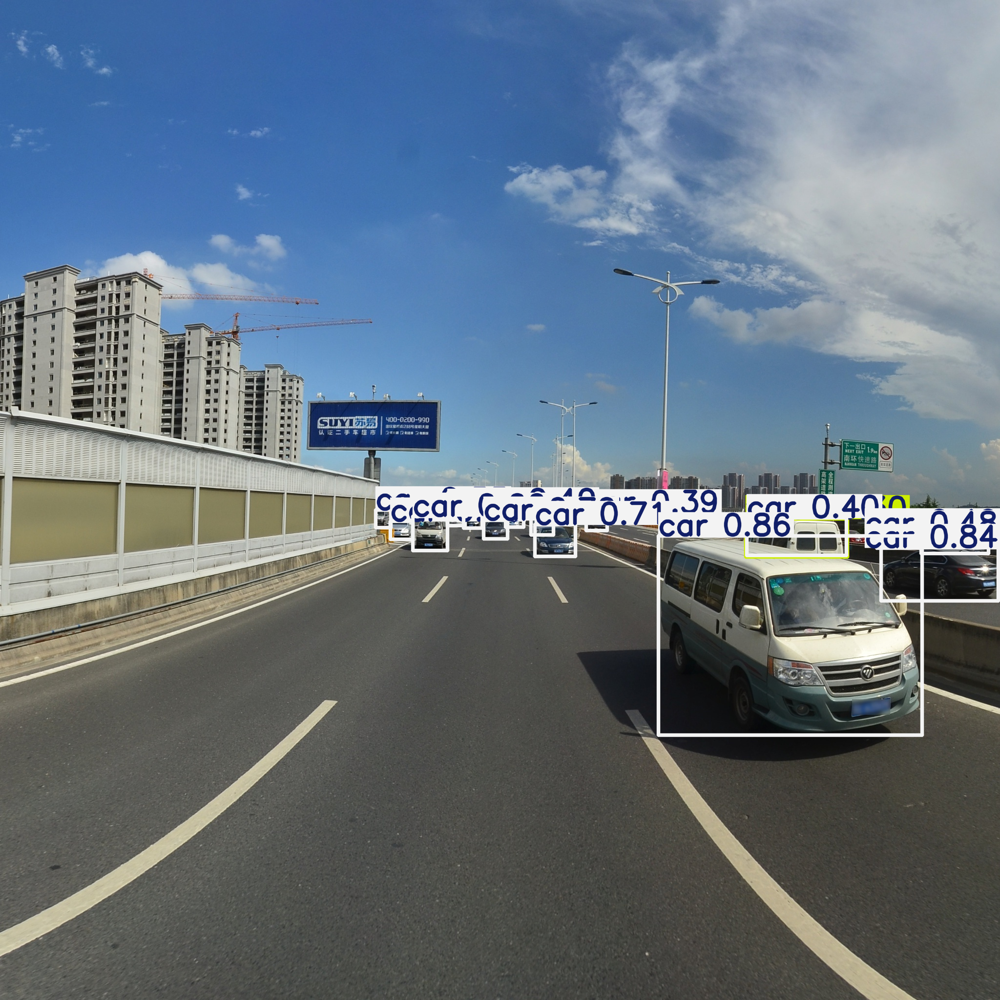

In [31]:
model = YOLO('yolov8s.pt')

image_path = '/kaggle/input/tt100k/mydata/images/val/10122.jpg'

# Perform inference
results = model(image_path)

# Show the image with bounding boxes and class labels
results[0].show()  # This will open the image with bounding boxes and class labels


image 1/1 /kaggle/input/tt100k/mydata/images/val/10128.jpg: 640x640 13 cars, 1 traffic light, 8.7ms
Speed: 3.4ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


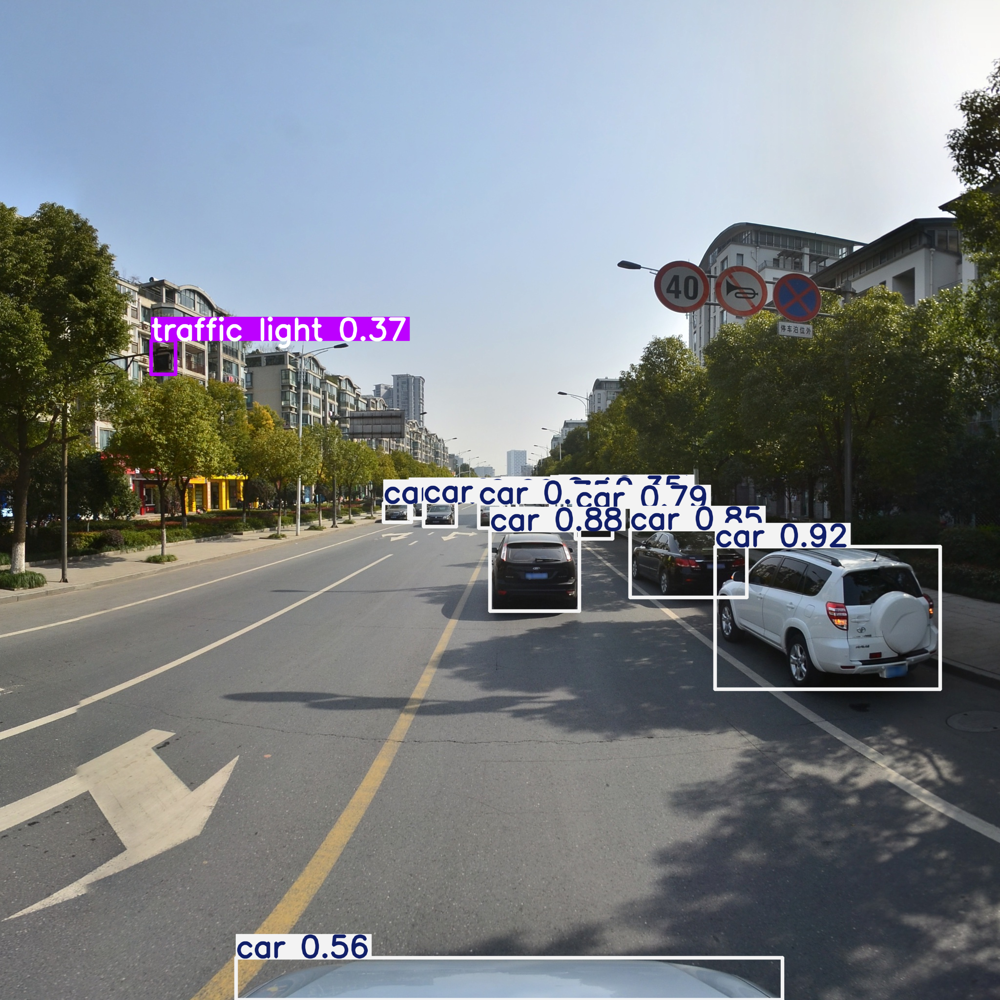

In [32]:
image_path = '/kaggle/input/tt100k/mydata/images/val/10128.jpg'

# Perform inference
results = model(image_path)

# Show the image with bounding boxes and class labels
results[0].show()  # This will open the image with bounding boxes and class labels

In [ ]:
# Train the model with augmentations enabled
model.train(
    data='updated_yaml_path',   # Path to your dataset YAML file
    epochs=20,                     # Number of epochs
    batch_size=16,                 # Batch size
    lr0=0.0001,                   # Initial learning rate (smaller)
    lrf=0.01,                     # Learning rate final factor
    momentum=0.937,                # Momentum
    weight_decay=0.0005,           # Regularization
    scheduler='cosine',
    augment=True,                  # Enable default augmentations
    hsv_h=0.015,                  # Adjust hue (hue shift)
    hsv_s=0.7,                    # Saturation (increase/decrease color saturation)
    hsv_v=0.4,                    # Value (brightness/contrast)
    flipud=0.5,                   # Vertical flip
    fliplr=0.5,                   # Horizontal flip
    rotation=10,                  # Rotation between -10 to +10 degrees
    scale=(0.5, 1.5),             # Scale augmentations (zoom in/out)
    perspective=0.0,              # Perspective transform
    shear=0.0,                    # Shearing
    translate=0.1,                # Translate (shift) images
    mosaic=True,                  # Use mosaic augmentation (combine 4 images)
    mixup=True,                   # Mixup augmentation (blend two images together)
    verbose=True                  # To display training logs
)
